In [64]:
import os
import sys
import json
import numpy as np
import matplotlib.pyplot as plt

sys.path.insert(0, '../codes/')
import bulkMotion
import misc


font_size=26
plt.rcParams.update({'font.size': font_size})

# Read all the paths from the json file

The velocity files, DEM files, and the geoemtry files are all stored on `marmot-nobak`. These paths are stored in `datasets.json`.

We will:

1. Read the paths from the json file into a dictioanry for future use.
2. Make a backup of the json file

In [2]:
## Build a dictionary to save all the LOSgeom class obj from different datasets (tracks)
all_class = dict()


## Read pre-defined paths
my_json = '../inputs/datasets.json'
with open(my_json) as file:
    pathDict = json.load(file)
    
    
## Save pre-defined paths to a back-up
with open('../inputs/datasets_bak.json'.format(my_json.split('.')[0]), 'w') as file:
    json_string = json.dumps(pathDict, default=lambda o: o.__dict__, sort_keys=True, indent=2)
    file.write(json_string)

# Plate motion model correction on the dataset

## Dataset: Makran ascending track 086

+ Processing: already with ERA5, SET, ionosphere, demErr corrections applied

+ Make sure to use the plate motion model from papers, replace the `pmm` variable to reflect the plate motion model name

+ Use the corresponding plate name to plot the plate boundary geoemtry and arrows on it



----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a086
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T86a/mintpy/merged_files/geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 16.55 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.03 seconds ----- got the model LOS velocity grid

No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (iono corr)>     	 shifted by 1.282490611076355
Reference data: <LOS Plate bulk motion>        	 shi

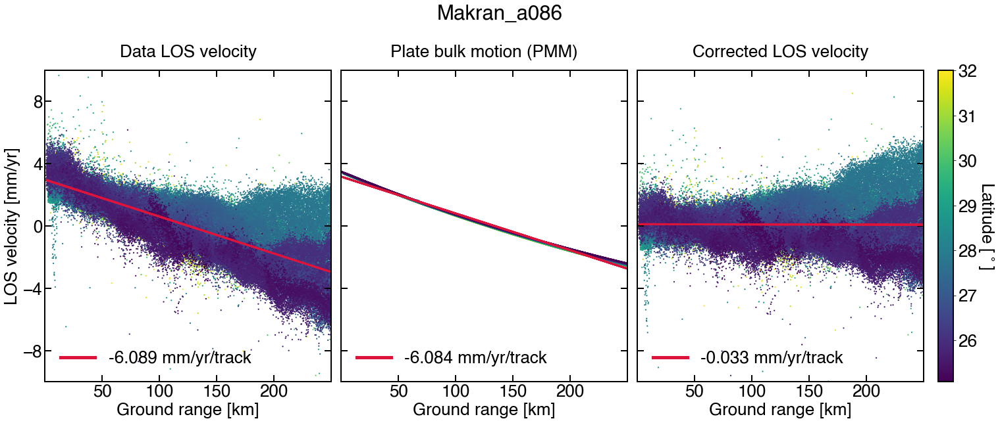


----- 27.66 seconds ----- plotted range ramps

only show one common colorbar in the first subplot
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T86a/mintpy/merged_files/merge_T86a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a086/dem_resamp_a086/a086.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T86a/mintpy/merged_files/merge_T86a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a086/dem_resamp_a086/a086.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --nosca

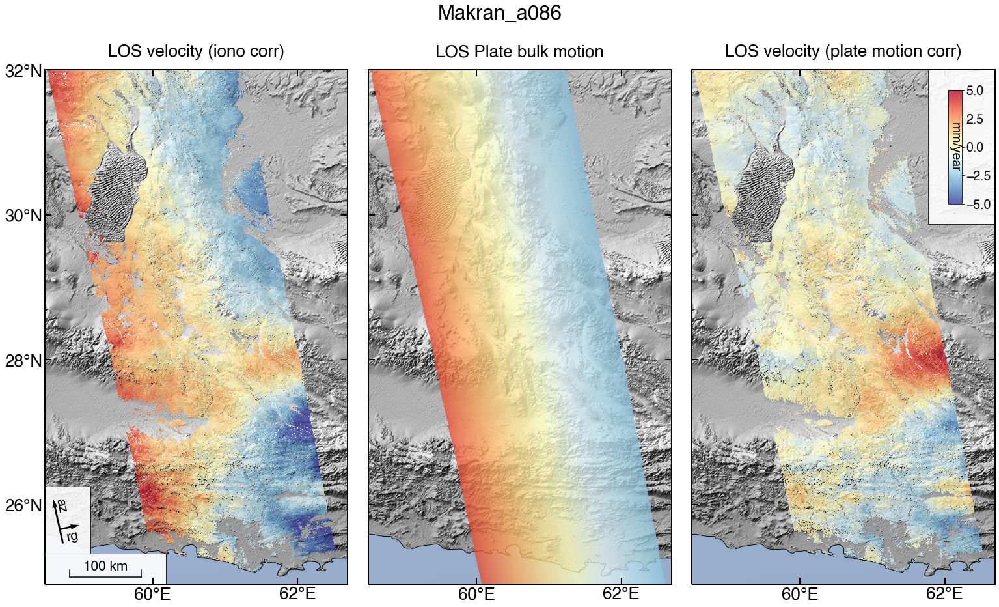


----- 12.70 seconds ----- plotted pmm correction


----- 0.07 seconds ----- saved .h5 files


===== 57.17 seconds ===== total time elapsed



In [3]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a086'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 14,
            'plot_pmm'     : False,
            'plot_ins'     : False,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,          
            'vlim_i'       : None,
            'vlim_r'       : [-10,10],
            'vlim_b'       : [-5,5],
            'refpoint'     : False,
            'shadeExg'     : 0.07,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdYlBu_r',
            'dpi'          : 100,          
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a013
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T13a/mintpy/merged_files/sub_geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 17.41 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.03 seconds ----- got the model LOS velocity grid

No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (iono corr)>     	 shifted by 0.817351222038269
Reference data: <LOS Plate bulk motion>        	

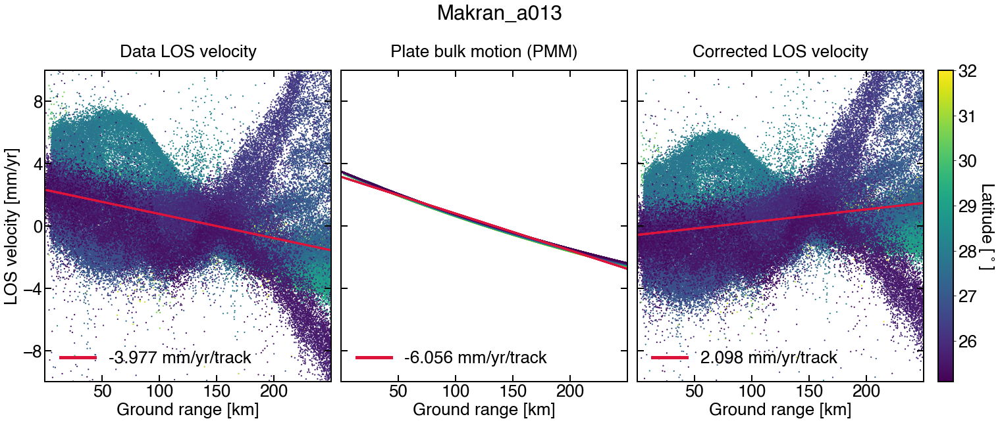


----- 27.81 seconds ----- plotted range ramps

only show one common colorbar in the first subplot
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T13a/mintpy/merged_files/merge_T13a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a013/dem_resamp_a013/a013.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T13a/mintpy/merged_files/merge_T13a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a013/dem_resamp_a013/a013.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --nosca

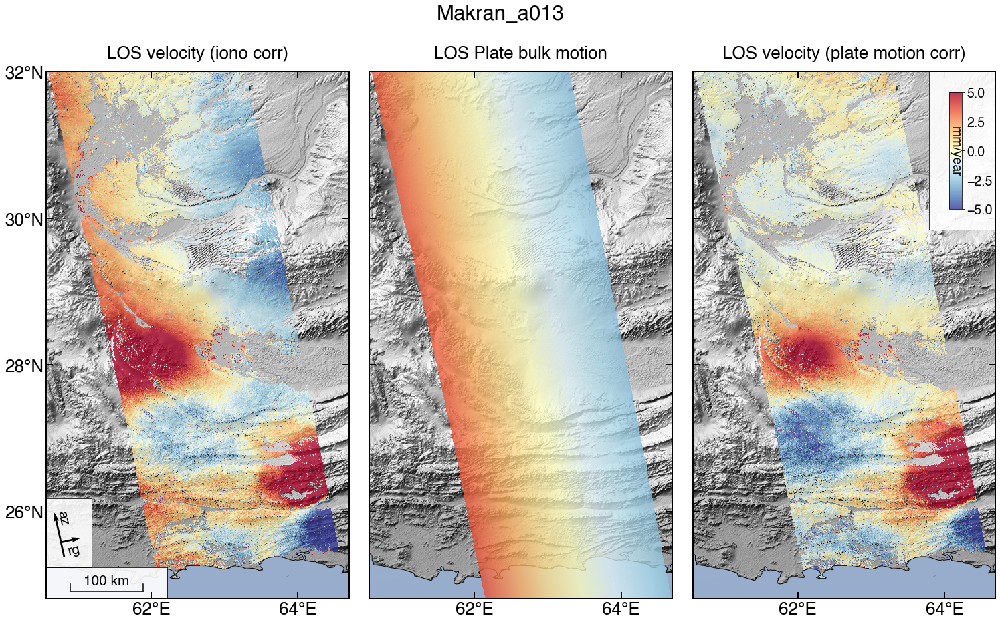


----- 8.87 seconds ----- plotted pmm correction


----- 0.07 seconds ----- saved .h5 files


===== 54.35 seconds ===== total time elapsed



In [4]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a013'
pName = 'Eurasia'
pmm   = 'ITRF14'

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a115
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T115a/mintpy/process_stack_all_time_full_eff_repeat_ion/inputs/geo_geometryRadar.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 18.36 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.02 seconds ----- got the model LOS velocity grid

No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (iono corr)>     	 shifted by -1.6312370300292969
Reference da

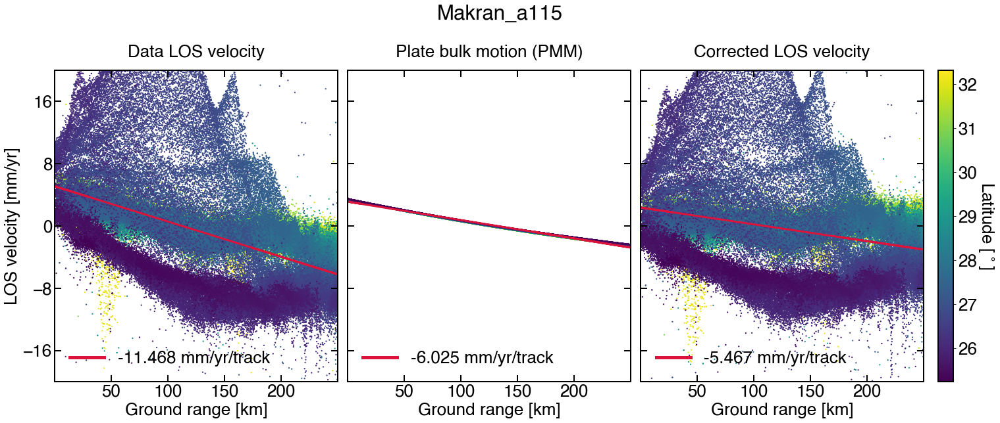


----- 36.19 seconds ----- plotted range ramps

Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T115a/mintpy/process_stack_all_time_full_eff_repeat_ion/timeseries_fits/geo_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -15 15 --mask no --dem /marmot-nobak/ykliu/makran/a115/dem_resamp_a115/a115.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T115a/mintpy/process_stack_all_time_full_eff_repeat_ion/timeseries_fits/geo_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a115/dem_resamp_a115/a115.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-st

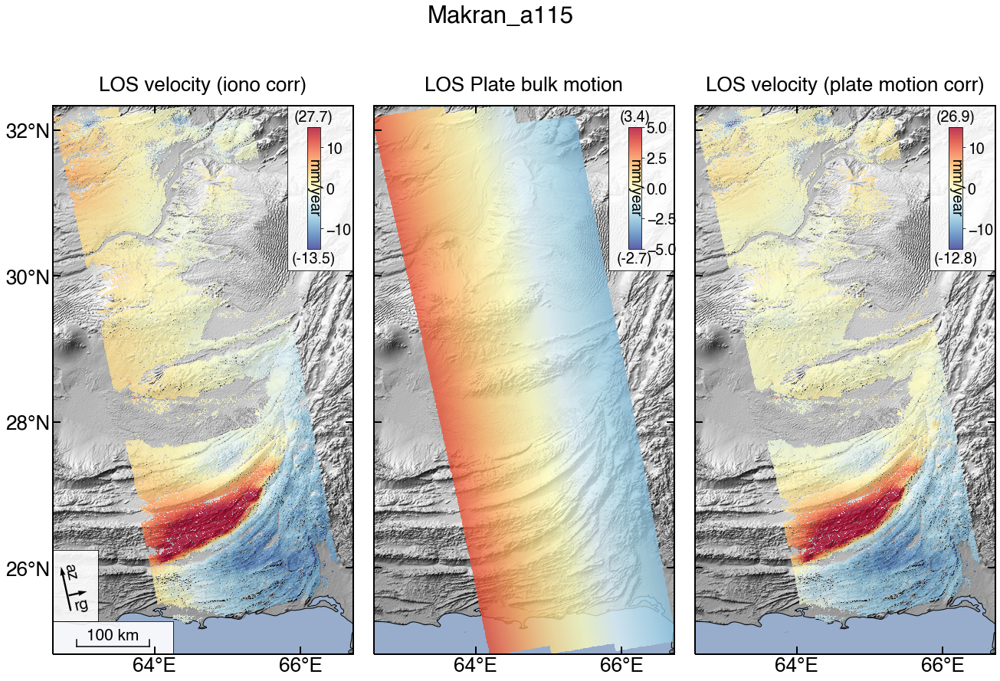


----- 9.36 seconds ----- plotted pmm correction


----- 0.08 seconds ----- saved .h5 files


===== 64.19 seconds ===== total time elapsed



In [5]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a115'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs['vlim_r'] = [-20,20]
kwargs['vlim_b'] = [[-15,15],[-5,5],[-15,15]]

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran a159
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T159a/mintpy/merged_files/sub_geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 17.02 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.02 seconds ----- got the model LOS velocity grid

No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (iono corr)>     	 shifted by 1.0524271726608276
Reference data: <LOS Plate bulk motion>       

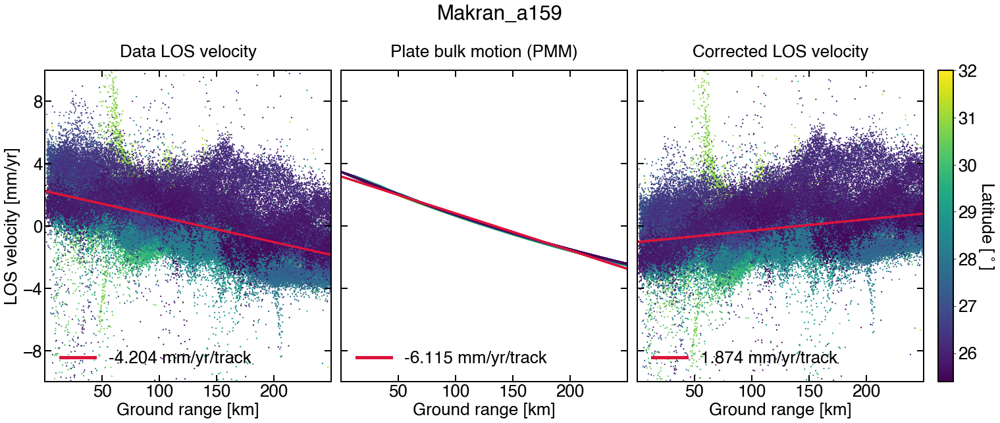


----- 24.80 seconds ----- plotted range ramps

only show one common colorbar in the first subplot
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T159a/mintpy/merged_files/merge_T159a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a159/dem_resamp_a159/a159.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T159a/mintpy/merged_files/merge_T159a_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/a159/dem_resamp_a159/a159.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --n

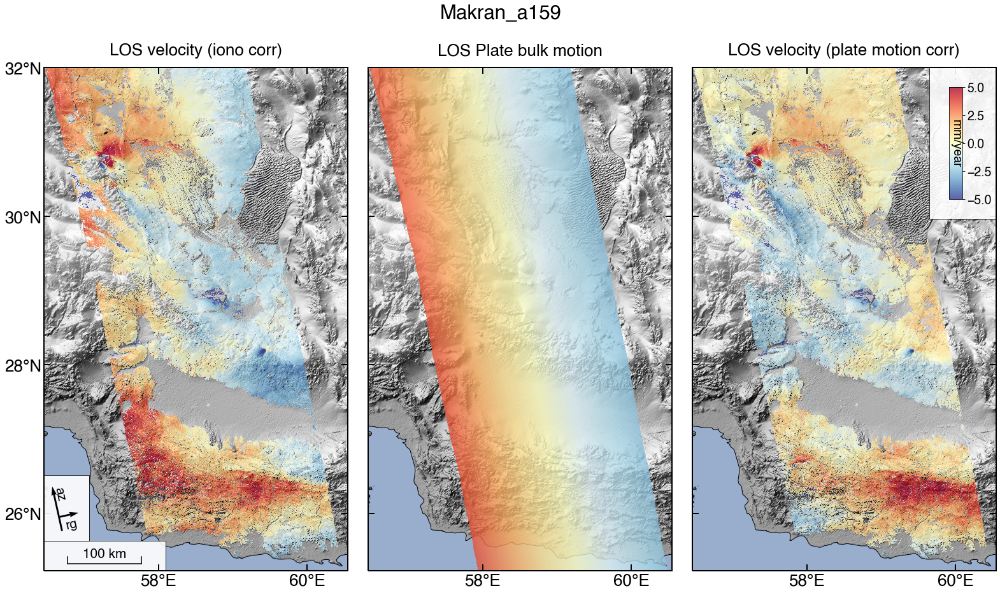


----- 9.09 seconds ----- plotted pmm correction


----- 0.08 seconds ----- saved .h5 files


===== 51.14 seconds ===== total time elapsed



In [6]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran a159'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs['vlim_r'] = [-10,10]
kwargs['vlim_b'] = [-5,5]

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Makran d020
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/olstephe/InSAR/Makran/T20d/mintpy/merged_files/sub_geometryGeo_merge.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Eurasia

Cartesian rotation vector:
 wx:            -0.0850 mas / yr
 wy:            -0.5310 mas / yr
 wz:            0.7700 mas / yr

Euler pole representation:
 Latitude:      55.0699 deg
 Longitude:     260.9055 deg
 Rotation rate: 0.2609 deg / Ma  

2D array locations

----- 16.15 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.03 seconds ----- got the model LOS velocity grid



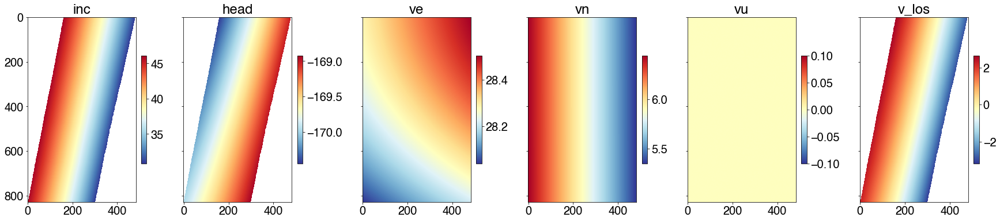

Min. LOS motion = -3.171
Max. LOS motion = 2.655
Dynamic range of LOS motion = 5.826
No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (iono corr)>     	 shifted by -1.0721075534820557
Reference data: <LOS Plate bulk motion>        	 shifted by 16.878989188114716

----- 1.62 seconds ----- applied correction on referenced data

Range ramp scatter plot shifted by median 0.0
Ground range min/max: 0.0 257.334
Valid (non-nan pixels) ground range min/max: 0.17575 256.69208
Ground range distance spans 256.5 km
Range ramp scatter plot shifted by median 0.0
Ground range min/max: 0.0 257.334
Valid (non-nan pixels) ground range min/max: 0.0 257.334
Ground range distance spans 257.3 km
Range ramp scatter plot shifted by median 0.0
Ground range min/max: 0.0 257.334
Valid (non-nan pixels) ground range min/max: 0.17575 256.69208
Ground range distance spans 256.5 km
Save to file (EXT=pdf, DPI=150, W/H=3150.0/1200.0 p): ../pic/Makran_d020_rampfit.pdf


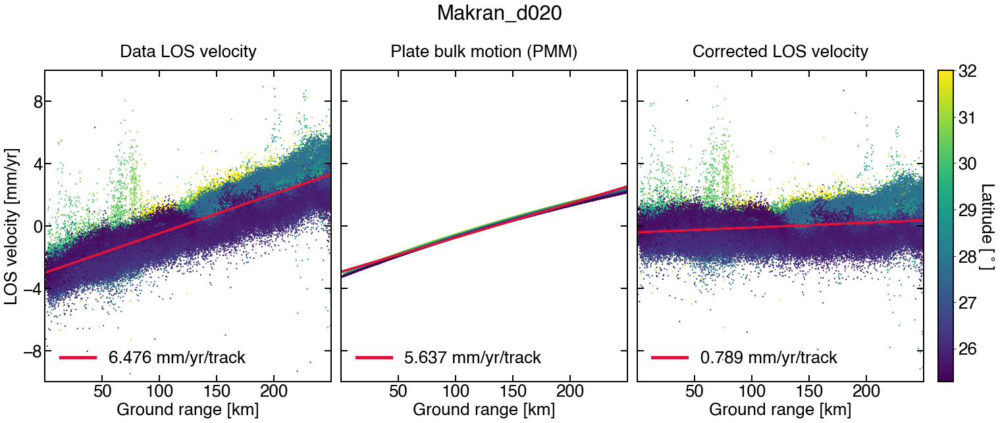


----- 23.82 seconds ----- plotted range ramps

only show one common colorbar in the first subplot
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/olstephe/InSAR/Makran/T20d/mintpy/merged_files/merge_T20d_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/d020/dem_resamp_d020/d020.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/olstephe/InSAR/Makran/T20d/mintpy/merged_files/merge_T20d_timeseries_fit_SET_ERA5_Ion_demErr_msk.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/makran/d020/dem_resamp_d020/d020.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --nosca

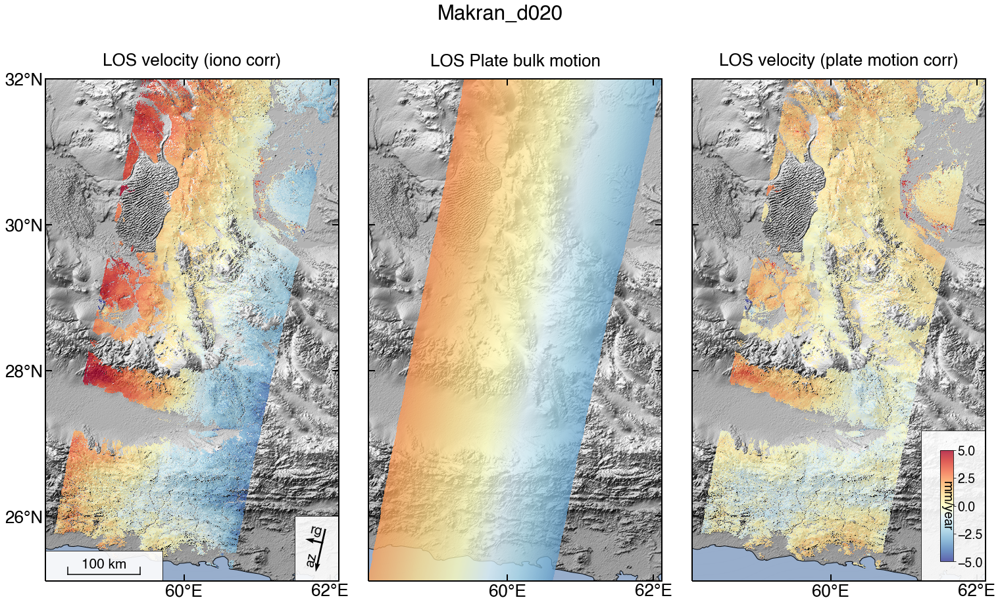


----- 8.77 seconds ----- plotted pmm correction


----- 0.07 seconds ----- saved .h5 files


===== 50.46 seconds ===== total time elapsed



In [23]:
omega_cart = [-0.085, -0.531, 0.770]

dName = 'Makran d020'
pName = 'Eurasia'
pmm   = 'ITRF14'

kwargs['plot_ins'] = True
kwargs['vlim_r'] = [-10,10]
kwargs['vlim_b'] = [-5,5]

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)

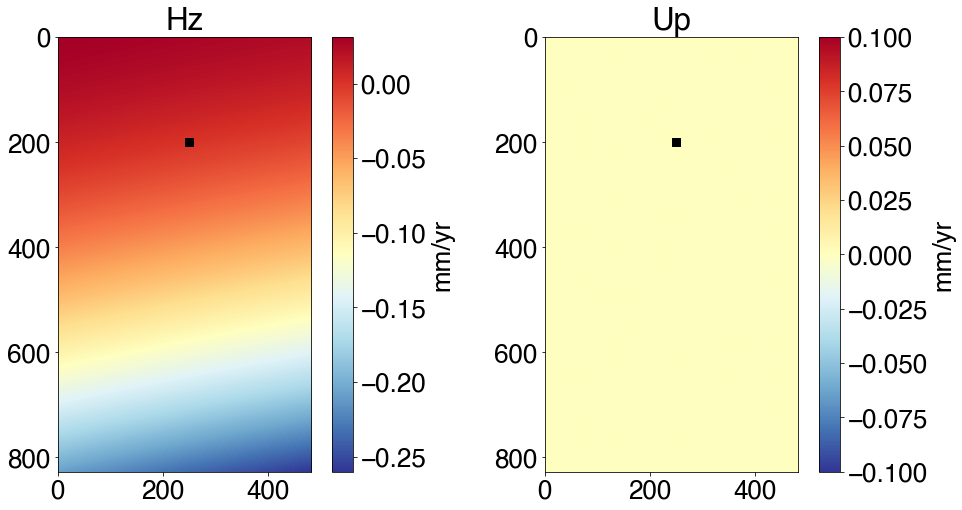

In [63]:

v_hz = np.sqrt(all_class[dName].ve**2 + all_class[dName].vn**2)
v_up = all_class[dName].vu

refy, refx = 200, 250

v_up -= v_up[refy, refx]
v_hz -= v_hz[refy, refx]


fig, ax = plt.subplots(figsize=[16,8], ncols=2)
im = ax[0].imshow(v_hz, cmap='RdYlBu_r')
ax[0].scatter(refx, refy, marker='s', s=80, c='k')
plt.colorbar(im, ax=ax[0], label='mm/yr')
ax[0].set_title('Hz')

im = ax[1].imshow(v_up, cmap='RdYlBu_r')
ax[1].scatter(refx, refy, marker='s', s=80, c='k')
plt.colorbar(im, ax=ax[1], label='mm/yr')
ax[1].set_title('Up')

plt.show()